In [ ]:
import torch
from torch.autograd import Variable
import torchvision.datasets as dsets
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt
import os
import imageio
from torch import nn

image_size=128
label_dim = 1
One_Hot_dim=75
G_input_dim = 128
G_output_dim = 3
D_input_dim = 3
D_output_dim = 1
num_filters = [1024, 512, 256, 128, 64, 32]

learning_rate = 0.0001
betas = (0.5, 0.999)
batch_size = 20
num_epochs = 500

# For logger
def to_np(x):
    return x.data.cpu().numpy()


def to_var(x):
    if torch.cuda.is_available():
        x = x.cuda()
    return Variable(x)


# De-normalization
def denorm(x):
    out = (x + 1) / 2
    return out.clamp(0, 1)


class Encoder(nn.Module):
    def __init__(self):
        super(Encoder, self).__init__()
        self.l1=nn.Sequential(nn.Linear(One_Hot_dim,G_input_dim),nn.ReLU(),nn.Linear(G_input_dim,G_input_dim))
    def forward(self,x):
        reses=torch.zeros(batch_size,G_input_dim).cuda()
        for i in range(5):
            res=self.l1(x[:,i*One_Hot_dim:(i+1)*One_Hot_dim])
            reses += res
        return reses
            


class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.l=nn.Linear(G_input_dim,G_input_dim)
        self.main = nn.Sequential(
            
            nn.ConvTranspose2d(G_input_dim, 512, 4, 1, 0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            nn.ConvTranspose2d(512, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 32, 4, 2, 1, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU(True),
            nn.ConvTranspose2d(32, G_output_dim, 4, 2, 1, bias=False),
            nn.Tanh(),
        )
    
    def forward(self, x, attr):
        return self.main(self.l(x).view(-1,G_input_dim,1,1))

class Classifier(nn.Module):
    def __init__(self):
        super(Classifier, self).__init__()
        self.feature_input = nn.Linear(64, 32 * 32)
        self.main = nn.Sequential(
            nn.Conv2d(D_input_dim, 64, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 200, 4, 1, 0, bias=False),
        )
        self.outlinear=nn.Sequential(nn.Linear(200,100),nn.LeakyReLU(0.2),nn.Linear(100,11))
    
    def forward(self, x, attr):
        #print(x)
        #x=torch.cat([x,self.feature_input(attr).view(-1,1,16,16)],1)
        return self.outlinear(self.main(x).view(-1, 200))





In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pickle
import random
import cv2
from google.colab.patches import cv2_imshow

f=open('drive/MyDrive/iclevrdata.pkl','rb')
#f=open('data (1).pkl','rb')
alldata = pickle.load(f)

lam=0.1

def one_hot_list(ii,l):
  li=[]
  for i in range(l):
    li.append(0)
  li[ii]=1
  return li

materialmap={'rubber':0,'metal':1}
colormap={'red':0,'green':1,'blue':2,'cyan':3,'brown':4,'gray':5,'purple':6,'yellow':7}
shapemap={'sphere':0, 'cube':1, 'cylinder':2}

def datatovec(d):
  complete=[]
  #print(d)
  #print(len(d))
  for i in d:
    complete += (one_hot_list((i['pixel_coords'][0])//15,32)+one_hot_list((i['pixel_coords'][1])//10,32)+one_hot_list(shapemap[i['shape']],3)+one_hot_list(colormap[i['color']],8))
  complete += ([0]*(13*(5-len(d))))
  #print(complete)
  return complete

def takeavg(li):
  a=0
  for i in li:
    a+=i
  return a/float(len(li))

"""
def boxonly(ds):
  mask=torch.zeros(batch_size,G_output_dim,image_size,image_size).cuda()
  for j in range(len(ds)):
    for i in ds[j]:
      #print(i)
      mask[j,:,int(i['ymin']/5.0):int(i['ymax']/5.0),int(i['xmin']/7.5):int(i['xmax']/7.5)]=1
  return mask
"""
    


import copy

criterion = torch.nn.MSELoss()

def masks(d):
  a=torch.zeros(1,3,image_size,image_size)
  x=(d['pixel_coords'][0])//15*4
  y=(d['pixel_coords'][1])//10*4
  #a[:,:,y-8:y+8,x-8:x+8]=1
  return (x,y)

fill = torch.ones([batch_size, label_dim, image_size, image_size])
train_data=[(datatovec(x[0]),cv2.resize(x[1],(image_size,image_size)),[masks(y) for y in x[0]]) for x in alldata['train']]
valid_data=[(datatovec(x[0]),cv2.resize(x[1],(image_size,image_size)),[masks(y) for y in x[0]]) for x in alldata['val']]
baseimg=copy.deepcopy(train_data[0][1])

def toimg(li):
  for i in range(3):
    for j in range(image_size):
      for k in range(image_size):
        #print(i)
        #print(j)
        #print(k)
        baseimg[j,k,i]=li[i][j][k]*255
  return baseimg





In [ ]:
def buildsubp(xs,ys,ts):
  cat=[]
  for i in range(len(xs)):
    sli=ts[i:i+1,:,ys[i]:ys[i]+32,xs[i]:xs[i]+32]
    if not sli.size()[3] == 32:
      print('ERROR! '+str(i)+' '+str(xs[i]))
    cat.append(sli)
    
  return torch.cat(cat,0)

C = Classifier()
C.cuda()
C_optimizer = torch.optim.RMSprop(C.parameters(), lr=learning_rate,weight_decay=0.03)


mat3=torch.LongTensor([[0],[1],[2]])
mat8=torch.LongTensor([[0],[1],[2],[3],[4],[5],[6],[7]])
ce=nn.CrossEntropyLoss()
for epoch in range(45):
  random.shuffle(train_data)
  if epoch%5==4:
    C_optimizer.param_groups[0]['lr'] /= 2
  colorloss=[]
  shapeloss=[]
  for i in range(len(train_data)//batch_size):
    start=i*batch_size
    end=(i+1)*batch_size
    trains=train_data[start:end]
    train_imgs=[x[1] for x in trains]
    train_vecs=[x[0] for x in trains]
    train_masks=[x[2] for x in trains]
    x_real=(torch.FloatTensor(train_imgs)/256).transpose(2,3).transpose(1,2).cuda()
    attrvec=torch.LongTensor(train_vecs).view(batch_size,-1)
    for j in range(5):
      parts=buildsubp([x[j][0] for x in train_masks],[x[j][1] for x in train_masks],x_real).cuda()
      newvecs=attrvec[:,j*75:j*75+64].cuda()
      shapevecs=attrvec[:,j*75+64:j*75+67]
      colorvecs=attrvec[:,j*75+67:j*75+75]
      shapelabels=torch.matmul(shapevecs,mat3)
      colorlabels=torch.matmul(colorvecs,mat8)
      #print(shapelabels)
      Cout=C(parts,newvecs.float())
      loss1=ce(Cout[:,0:3],shapelabels.squeeze().cuda())
      loss2=ce(Cout[:,3:11],colorlabels.squeeze().cuda())
      C.zero_grad()
      (loss1+loss2).backward()
      C_optimizer.step()
      
      colorloss.append(loss2)
      shapeloss.append(loss1)
  print('epoch '+str(epoch)+' Train Color loss: '+str(takeavg(colorloss))+' shape loss: '+str(takeavg(shapeloss)))
  with torch.no_grad():
    colorloss=[]
    shapeloss=[]
    for i in range(len(valid_data)//batch_size):
      start=i*batch_size
      end=(i+1)*batch_size
      trains=valid_data[start:end]
      train_imgs=[x[1] for x in trains]
      train_vecs=[x[0] for x in trains]
      train_masks=[x[2] for x in trains]
      x_real=(torch.FloatTensor(train_imgs)/256).transpose(2,3).transpose(1,2).cuda()
      attrvec=torch.LongTensor(train_vecs).view(batch_size,-1)
      for j in range(5):
        parts=buildsubp([x[j][0] for x in train_masks],[x[j][1] for x in train_masks],x_real).cuda()
        newvecs=attrvec[:,j*75:j*75+64].cuda()
        shapevecs=attrvec[:,j*75+64:j*75+67]
        colorvecs=attrvec[:,j*75+67:j*75+75]
        shapelabels=torch.matmul(shapevecs,mat3)
        colorlabels=torch.matmul(colorvecs,mat8)
        #print(shapelabels)
        Cout=C(parts,newvecs.float())
        loss1=ce(Cout[:,0:3],shapelabels.squeeze().cuda())
        loss2=ce(Cout[:,3:11],colorlabels.squeeze().cuda())
        colorloss.append(loss2)
        shapeloss.append(loss1)
    print('epoch '+str(epoch)+' Valid Color loss: '+str(takeavg(colorloss))+' shape loss: '+str(takeavg(shapeloss)))

      
torch.save(C,'/content/drive/MyDrive/C_128.pt')

    


epoch 0 Train Color loss: tensor(0.1793, device='cuda:0', grad_fn=<DivBackward0>) shape loss: tensor(0.7024, device='cuda:0', grad_fn=<DivBackward0>)
epoch 0 Valid Color loss: tensor(0.0945, device='cuda:0') shape loss: tensor(0.5877, device='cuda:0')
epoch 1 Train Color loss: tensor(0.0942, device='cuda:0', grad_fn=<DivBackward0>) shape loss: tensor(0.5127, device='cuda:0', grad_fn=<DivBackward0>)
epoch 1 Valid Color loss: tensor(0.0820, device='cuda:0') shape loss: tensor(0.4736, device='cuda:0')
epoch 2 Train Color loss: tensor(0.0872, device='cuda:0', grad_fn=<DivBackward0>) shape loss: tensor(0.4413, device='cuda:0', grad_fn=<DivBackward0>)
epoch 2 Valid Color loss: tensor(0.0965, device='cuda:0') shape loss: tensor(0.4255, device='cuda:0')
epoch 3 Train Color loss: tensor(0.0899, device='cuda:0', grad_fn=<DivBackward0>) shape loss: tensor(0.3890, device='cuda:0', grad_fn=<DivBackward0>)
epoch 3 Valid Color loss: tensor(0.0961, device='cuda:0') shape loss: tensor(0.3769, device='c

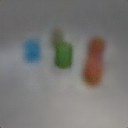

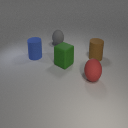

epoch 0 Train Color: tensor(0.7610, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.7327, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0025, device='cuda:0', grad_fn=<DivBackward0>)


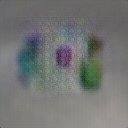

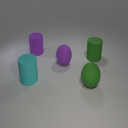

epoch 0 Valid Color: tensor(0.7703, device='cuda:0') shape: tensor(0.5253, device='cuda:0') GMSE: tensor(0.0026, device='cuda:0')


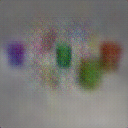

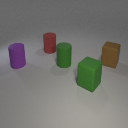

epoch 1 Train Color: tensor(0.3780, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.3074, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0019, device='cuda:0', grad_fn=<DivBackward0>)


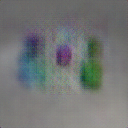

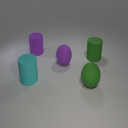

epoch 1 Valid Color: tensor(0.6635, device='cuda:0') shape: tensor(0.4002, device='cuda:0') GMSE: tensor(0.0024, device='cuda:0')


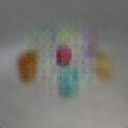

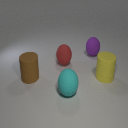

epoch 2 Train Color: tensor(0.2847, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.1588, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0018, device='cuda:0', grad_fn=<DivBackward0>)


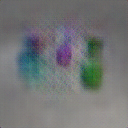

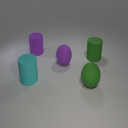

epoch 2 Valid Color: tensor(0.6354, device='cuda:0') shape: tensor(0.3514, device='cuda:0') GMSE: tensor(0.0024, device='cuda:0')


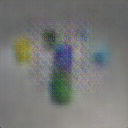

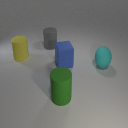

epoch 3 Train Color: tensor(0.2249, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0979, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0017, device='cuda:0', grad_fn=<DivBackward0>)


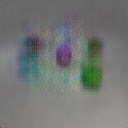

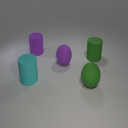

epoch 3 Valid Color: tensor(0.5842, device='cuda:0') shape: tensor(0.3313, device='cuda:0') GMSE: tensor(0.0022, device='cuda:0')


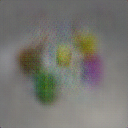

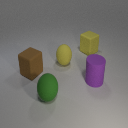

epoch 4 Train Color: tensor(0.1835, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0684, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0016, device='cuda:0', grad_fn=<DivBackward0>)


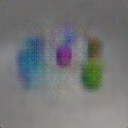

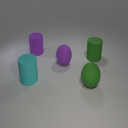

epoch 4 Valid Color: tensor(0.5538, device='cuda:0') shape: tensor(0.2755, device='cuda:0') GMSE: tensor(0.0022, device='cuda:0')


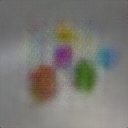

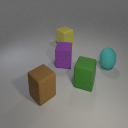

epoch 5 Train Color: tensor(0.1597, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0543, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0016, device='cuda:0', grad_fn=<DivBackward0>)


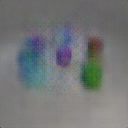

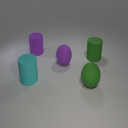

epoch 5 Valid Color: tensor(0.5214, device='cuda:0') shape: tensor(0.2600, device='cuda:0') GMSE: tensor(0.0021, device='cuda:0')


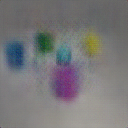

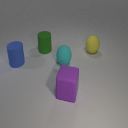

epoch 6 Train Color: tensor(0.1437, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0485, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0015, device='cuda:0', grad_fn=<DivBackward0>)


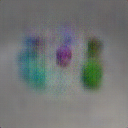

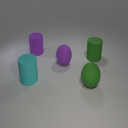

epoch 6 Valid Color: tensor(0.4739, device='cuda:0') shape: tensor(0.2450, device='cuda:0') GMSE: tensor(0.0021, device='cuda:0')


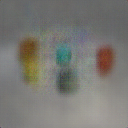

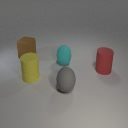

epoch 7 Train Color: tensor(0.1221, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0355, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0015, device='cuda:0', grad_fn=<DivBackward0>)


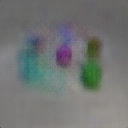

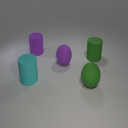

epoch 7 Valid Color: tensor(0.4693, device='cuda:0') shape: tensor(0.2290, device='cuda:0') GMSE: tensor(0.0021, device='cuda:0')


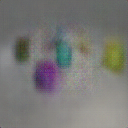

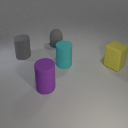

epoch 8 Train Color: tensor(0.1123, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0313, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0015, device='cuda:0', grad_fn=<DivBackward0>)


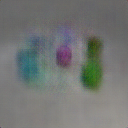

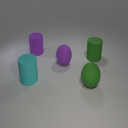

epoch 8 Valid Color: tensor(0.4390, device='cuda:0') shape: tensor(0.2055, device='cuda:0') GMSE: tensor(0.0020, device='cuda:0')


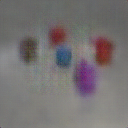

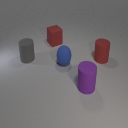

epoch 9 Train Color: tensor(0.0648, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0108, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0013, device='cuda:0', grad_fn=<DivBackward0>)


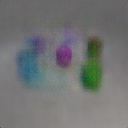

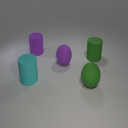

epoch 9 Valid Color: tensor(0.3819, device='cuda:0') shape: tensor(0.1681, device='cuda:0') GMSE: tensor(0.0018, device='cuda:0')


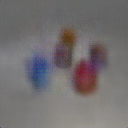

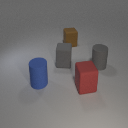

epoch 10 Train Color: tensor(0.0538, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0106, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0012, device='cuda:0', grad_fn=<DivBackward0>)


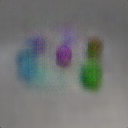

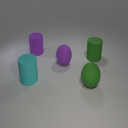

epoch 10 Valid Color: tensor(0.3727, device='cuda:0') shape: tensor(0.1819, device='cuda:0') GMSE: tensor(0.0018, device='cuda:0')


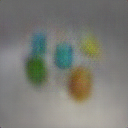

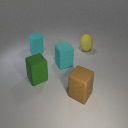

epoch 11 Train Color: tensor(0.0538, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0087, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0012, device='cuda:0', grad_fn=<DivBackward0>)


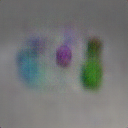

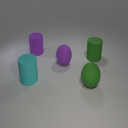

epoch 11 Valid Color: tensor(0.3671, device='cuda:0') shape: tensor(0.1743, device='cuda:0') GMSE: tensor(0.0018, device='cuda:0')


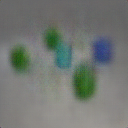

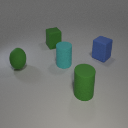

epoch 12 Train Color: tensor(0.0475, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0094, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0011, device='cuda:0', grad_fn=<DivBackward0>)


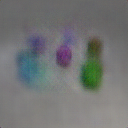

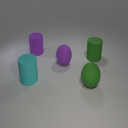

epoch 12 Valid Color: tensor(0.3637, device='cuda:0') shape: tensor(0.1862, device='cuda:0') GMSE: tensor(0.0018, device='cuda:0')


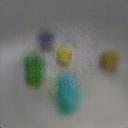

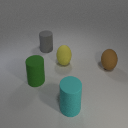

epoch 13 Train Color: tensor(0.0444, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0106, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0011, device='cuda:0', grad_fn=<DivBackward0>)


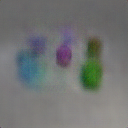

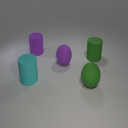

epoch 13 Valid Color: tensor(0.3539, device='cuda:0') shape: tensor(0.1748, device='cuda:0') GMSE: tensor(0.0018, device='cuda:0')


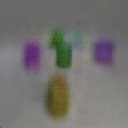

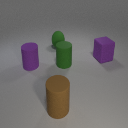

epoch 14 Train Color: tensor(0.0428, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0079, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0011, device='cuda:0', grad_fn=<DivBackward0>)


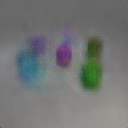

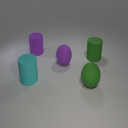

epoch 14 Valid Color: tensor(0.3644, device='cuda:0') shape: tensor(0.1752, device='cuda:0') GMSE: tensor(0.0018, device='cuda:0')


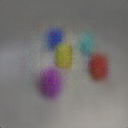

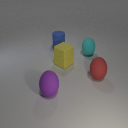

epoch 15 Train Color: tensor(0.0434, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0090, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0010, device='cuda:0', grad_fn=<DivBackward0>)


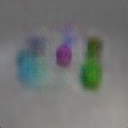

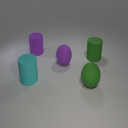

epoch 15 Valid Color: tensor(0.3536, device='cuda:0') shape: tensor(0.1903, device='cuda:0') GMSE: tensor(0.0018, device='cuda:0')


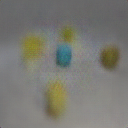

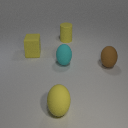

epoch 16 Train Color: tensor(0.0406, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0087, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0010, device='cuda:0', grad_fn=<DivBackward0>)


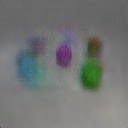

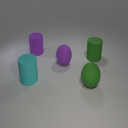

epoch 16 Valid Color: tensor(0.3535, device='cuda:0') shape: tensor(0.1758, device='cuda:0') GMSE: tensor(0.0018, device='cuda:0')


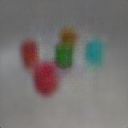

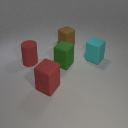

epoch 17 Train Color: tensor(0.0376, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0073, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0010, device='cuda:0', grad_fn=<DivBackward0>)


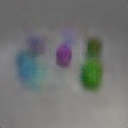

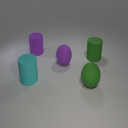

epoch 17 Valid Color: tensor(0.3433, device='cuda:0') shape: tensor(0.1617, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


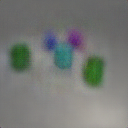

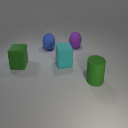

epoch 18 Train Color: tensor(0.0384, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0110, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0010, device='cuda:0', grad_fn=<DivBackward0>)


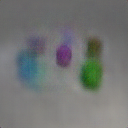

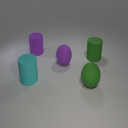

epoch 18 Valid Color: tensor(0.3463, device='cuda:0') shape: tensor(0.1669, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


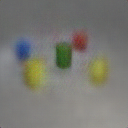

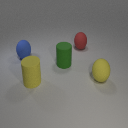

epoch 19 Train Color: tensor(0.0332, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0042, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0009, device='cuda:0', grad_fn=<DivBackward0>)


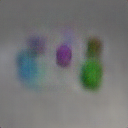

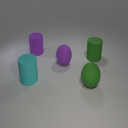

epoch 19 Valid Color: tensor(0.3341, device='cuda:0') shape: tensor(0.1585, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


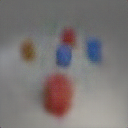

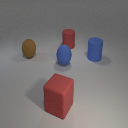

epoch 20 Train Color: tensor(0.0316, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0041, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0009, device='cuda:0', grad_fn=<DivBackward0>)


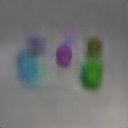

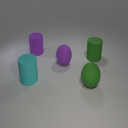

epoch 20 Valid Color: tensor(0.3353, device='cuda:0') shape: tensor(0.1616, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


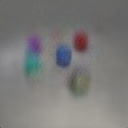

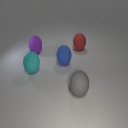

epoch 21 Train Color: tensor(0.0307, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0040, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0009, device='cuda:0', grad_fn=<DivBackward0>)


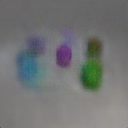

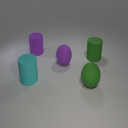

epoch 21 Valid Color: tensor(0.3400, device='cuda:0') shape: tensor(0.1627, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


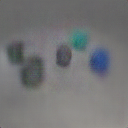

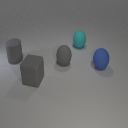

epoch 22 Train Color: tensor(0.0300, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0039, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0009, device='cuda:0', grad_fn=<DivBackward0>)


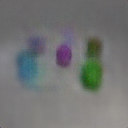

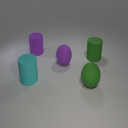

epoch 22 Valid Color: tensor(0.3322, device='cuda:0') shape: tensor(0.1577, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


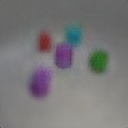

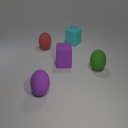

epoch 23 Train Color: tensor(0.0304, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0037, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0008, device='cuda:0', grad_fn=<DivBackward0>)


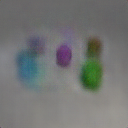

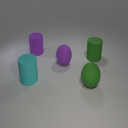

epoch 23 Valid Color: tensor(0.3372, device='cuda:0') shape: tensor(0.1588, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


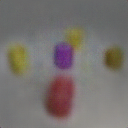

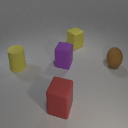

epoch 24 Train Color: tensor(0.0300, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0037, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0008, device='cuda:0', grad_fn=<DivBackward0>)


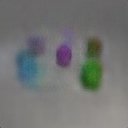

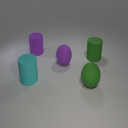

epoch 24 Valid Color: tensor(0.3342, device='cuda:0') shape: tensor(0.1604, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


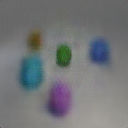

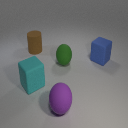

epoch 25 Train Color: tensor(0.0304, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0036, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0008, device='cuda:0', grad_fn=<DivBackward0>)


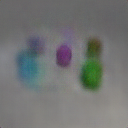

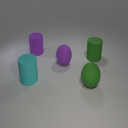

epoch 25 Valid Color: tensor(0.3355, device='cuda:0') shape: tensor(0.1580, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


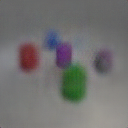

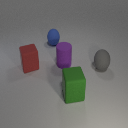

epoch 26 Train Color: tensor(0.0294, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0035, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0008, device='cuda:0', grad_fn=<DivBackward0>)


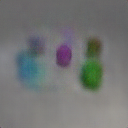

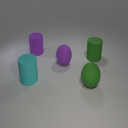

epoch 26 Valid Color: tensor(0.3333, device='cuda:0') shape: tensor(0.1591, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


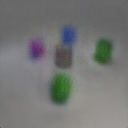

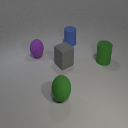

epoch 27 Train Color: tensor(0.0283, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0034, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0008, device='cuda:0', grad_fn=<DivBackward0>)


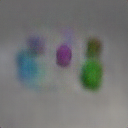

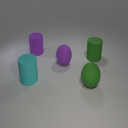

epoch 27 Valid Color: tensor(0.3342, device='cuda:0') shape: tensor(0.1601, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


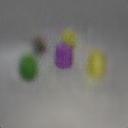

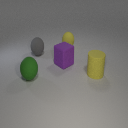

epoch 28 Train Color: tensor(0.0282, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0034, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0008, device='cuda:0', grad_fn=<DivBackward0>)


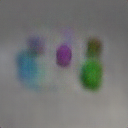

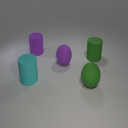

epoch 28 Valid Color: tensor(0.3332, device='cuda:0') shape: tensor(0.1608, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


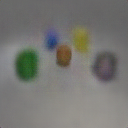

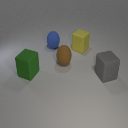

epoch 29 Train Color: tensor(0.0272, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0032, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0008, device='cuda:0', grad_fn=<DivBackward0>)


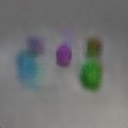

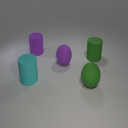

epoch 29 Valid Color: tensor(0.3292, device='cuda:0') shape: tensor(0.1584, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


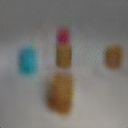

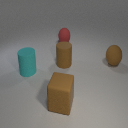

epoch 30 Train Color: tensor(0.0264, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0031, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0007, device='cuda:0', grad_fn=<DivBackward0>)


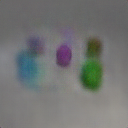

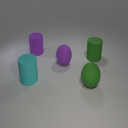

epoch 30 Valid Color: tensor(0.3320, device='cuda:0') shape: tensor(0.1593, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


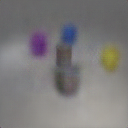

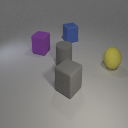

epoch 31 Train Color: tensor(0.0266, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0031, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0007, device='cuda:0', grad_fn=<DivBackward0>)


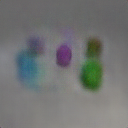

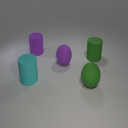

epoch 31 Valid Color: tensor(0.3300, device='cuda:0') shape: tensor(0.1575, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


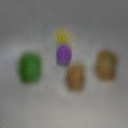

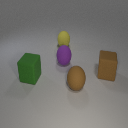

epoch 32 Train Color: tensor(0.0263, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0031, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0007, device='cuda:0', grad_fn=<DivBackward0>)


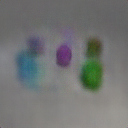

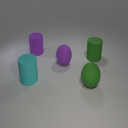

epoch 32 Valid Color: tensor(0.3320, device='cuda:0') shape: tensor(0.1582, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


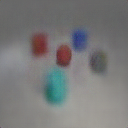

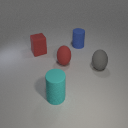

epoch 33 Train Color: tensor(0.0264, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0031, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0007, device='cuda:0', grad_fn=<DivBackward0>)


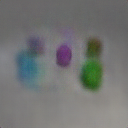

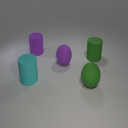

epoch 33 Valid Color: tensor(0.3333, device='cuda:0') shape: tensor(0.1567, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


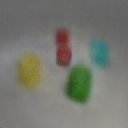

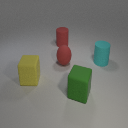

epoch 34 Train Color: tensor(0.0261, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0030, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0007, device='cuda:0', grad_fn=<DivBackward0>)


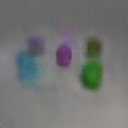

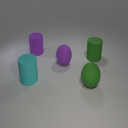

epoch 34 Valid Color: tensor(0.3339, device='cuda:0') shape: tensor(0.1581, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


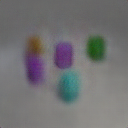

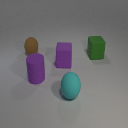

epoch 35 Train Color: tensor(0.0261, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0030, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0007, device='cuda:0', grad_fn=<DivBackward0>)


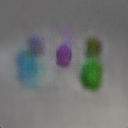

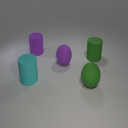

epoch 35 Valid Color: tensor(0.3347, device='cuda:0') shape: tensor(0.1603, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


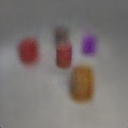

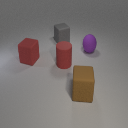

epoch 36 Train Color: tensor(0.0262, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0030, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0007, device='cuda:0', grad_fn=<DivBackward0>)


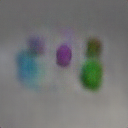

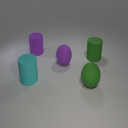

epoch 36 Valid Color: tensor(0.3317, device='cuda:0') shape: tensor(0.1586, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


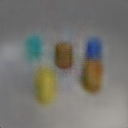

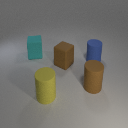

epoch 37 Train Color: tensor(0.0259, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0029, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0007, device='cuda:0', grad_fn=<DivBackward0>)


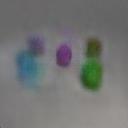

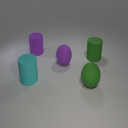

epoch 37 Valid Color: tensor(0.3346, device='cuda:0') shape: tensor(0.1590, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


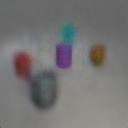

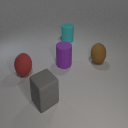

epoch 38 Train Color: tensor(0.0256, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0029, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0007, device='cuda:0', grad_fn=<DivBackward0>)


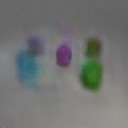

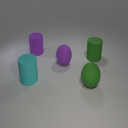

epoch 38 Valid Color: tensor(0.3380, device='cuda:0') shape: tensor(0.1604, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


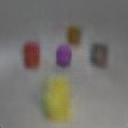

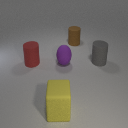

epoch 39 Train Color: tensor(0.0253, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0028, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0007, device='cuda:0', grad_fn=<DivBackward0>)


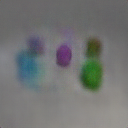

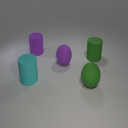

epoch 39 Valid Color: tensor(0.3349, device='cuda:0') shape: tensor(0.1585, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


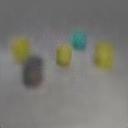

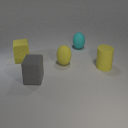

epoch 40 Train Color: tensor(0.0252, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0029, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0007, device='cuda:0', grad_fn=<DivBackward0>)


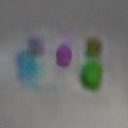

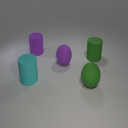

epoch 40 Valid Color: tensor(0.3337, device='cuda:0') shape: tensor(0.1583, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


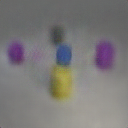

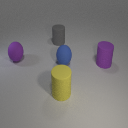

epoch 41 Train Color: tensor(0.0251, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0028, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0007, device='cuda:0', grad_fn=<DivBackward0>)


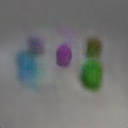

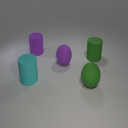

epoch 41 Valid Color: tensor(0.3360, device='cuda:0') shape: tensor(0.1585, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


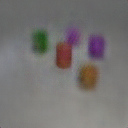

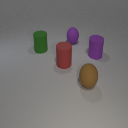

epoch 42 Train Color: tensor(0.0251, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0028, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0007, device='cuda:0', grad_fn=<DivBackward0>)


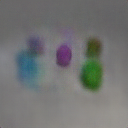

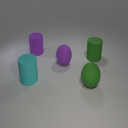

epoch 42 Valid Color: tensor(0.3357, device='cuda:0') shape: tensor(0.1574, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


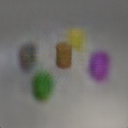

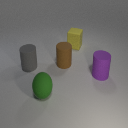

epoch 43 Train Color: tensor(0.0252, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0028, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0007, device='cuda:0', grad_fn=<DivBackward0>)


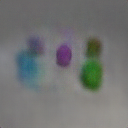

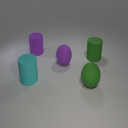

epoch 43 Valid Color: tensor(0.3359, device='cuda:0') shape: tensor(0.1589, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


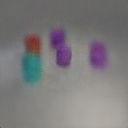

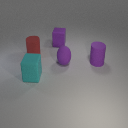

epoch 44 Train Color: tensor(0.0250, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0028, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0007, device='cuda:0', grad_fn=<DivBackward0>)


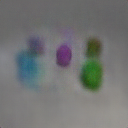

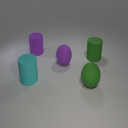

epoch 44 Valid Color: tensor(0.3352, device='cuda:0') shape: tensor(0.1576, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


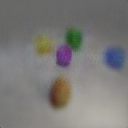

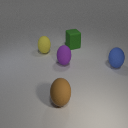

epoch 45 Train Color: tensor(0.0250, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0028, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0007, device='cuda:0', grad_fn=<DivBackward0>)


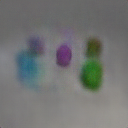

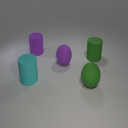

epoch 45 Valid Color: tensor(0.3377, device='cuda:0') shape: tensor(0.1575, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


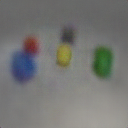

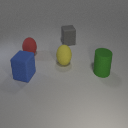

epoch 46 Train Color: tensor(0.0250, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0028, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0007, device='cuda:0', grad_fn=<DivBackward0>)


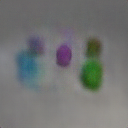

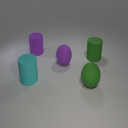

epoch 46 Valid Color: tensor(0.3366, device='cuda:0') shape: tensor(0.1585, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


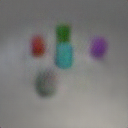

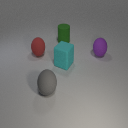

epoch 47 Train Color: tensor(0.0248, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0028, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0007, device='cuda:0', grad_fn=<DivBackward0>)


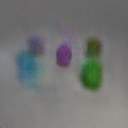

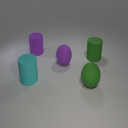

epoch 47 Valid Color: tensor(0.3379, device='cuda:0') shape: tensor(0.1572, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


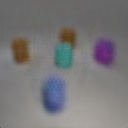

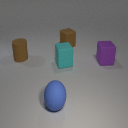

epoch 48 Train Color: tensor(0.0249, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0028, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0007, device='cuda:0', grad_fn=<DivBackward0>)


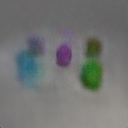

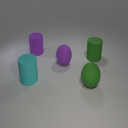

epoch 48 Valid Color: tensor(0.3383, device='cuda:0') shape: tensor(0.1581, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


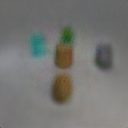

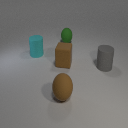

epoch 49 Train Color: tensor(0.0246, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0027, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


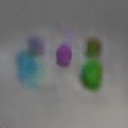

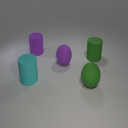

epoch 49 Valid Color: tensor(0.3373, device='cuda:0') shape: tensor(0.1570, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


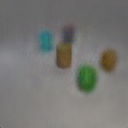

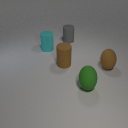

epoch 50 Train Color: tensor(0.0249, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0027, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


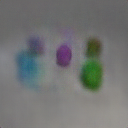

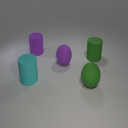

epoch 50 Valid Color: tensor(0.3368, device='cuda:0') shape: tensor(0.1581, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


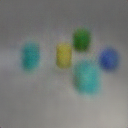

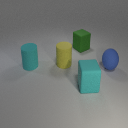

epoch 51 Train Color: tensor(0.0250, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0027, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


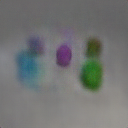

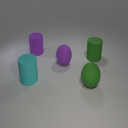

epoch 51 Valid Color: tensor(0.3370, device='cuda:0') shape: tensor(0.1580, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


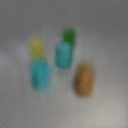

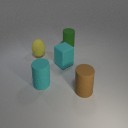

epoch 52 Train Color: tensor(0.0248, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0027, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


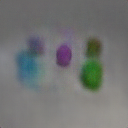

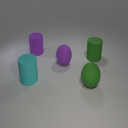

epoch 52 Valid Color: tensor(0.3374, device='cuda:0') shape: tensor(0.1578, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


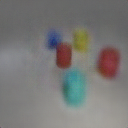

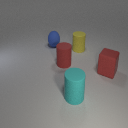

epoch 53 Train Color: tensor(0.0246, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0027, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


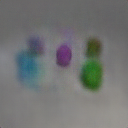

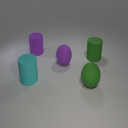

epoch 53 Valid Color: tensor(0.3385, device='cuda:0') shape: tensor(0.1580, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


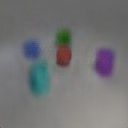

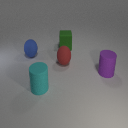

epoch 54 Train Color: tensor(0.0247, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0027, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


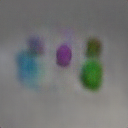

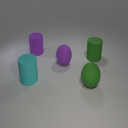

epoch 54 Valid Color: tensor(0.3388, device='cuda:0') shape: tensor(0.1576, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


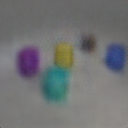

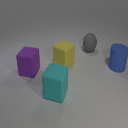

epoch 55 Train Color: tensor(0.0246, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0027, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


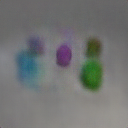

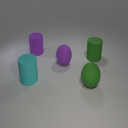

epoch 55 Valid Color: tensor(0.3386, device='cuda:0') shape: tensor(0.1586, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


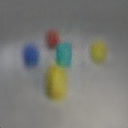

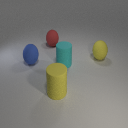

epoch 56 Train Color: tensor(0.0246, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0027, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


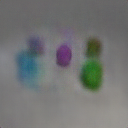

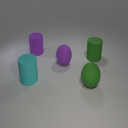

epoch 56 Valid Color: tensor(0.3373, device='cuda:0') shape: tensor(0.1585, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


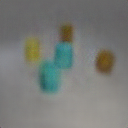

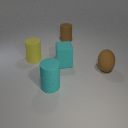

epoch 57 Train Color: tensor(0.0246, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0027, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


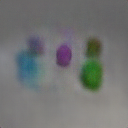

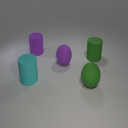

epoch 57 Valid Color: tensor(0.3378, device='cuda:0') shape: tensor(0.1577, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


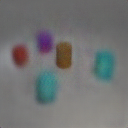

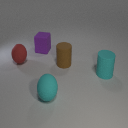

epoch 58 Train Color: tensor(0.0245, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0027, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


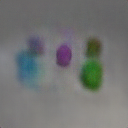

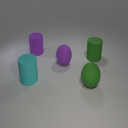

epoch 58 Valid Color: tensor(0.3387, device='cuda:0') shape: tensor(0.1581, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


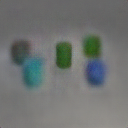

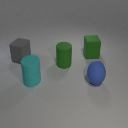

epoch 59 Train Color: tensor(0.0246, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0027, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


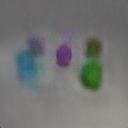

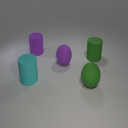

epoch 59 Valid Color: tensor(0.3377, device='cuda:0') shape: tensor(0.1575, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


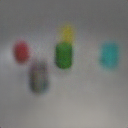

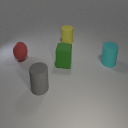

epoch 60 Train Color: tensor(0.0245, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0027, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


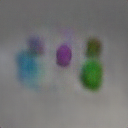

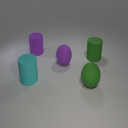

epoch 60 Valid Color: tensor(0.3379, device='cuda:0') shape: tensor(0.1578, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


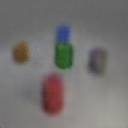

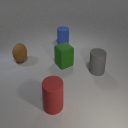

epoch 61 Train Color: tensor(0.0245, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0027, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


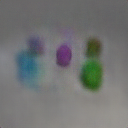

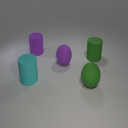

epoch 61 Valid Color: tensor(0.3384, device='cuda:0') shape: tensor(0.1581, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


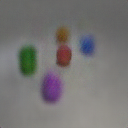

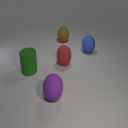

epoch 62 Train Color: tensor(0.0246, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0027, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


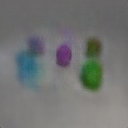

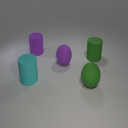

epoch 62 Valid Color: tensor(0.3385, device='cuda:0') shape: tensor(0.1578, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


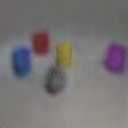

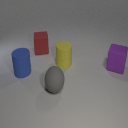

epoch 63 Train Color: tensor(0.0242, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0027, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


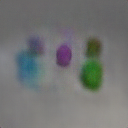

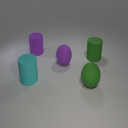

epoch 63 Valid Color: tensor(0.3388, device='cuda:0') shape: tensor(0.1582, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


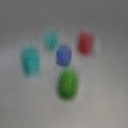

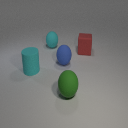

epoch 64 Train Color: tensor(0.0248, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0027, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


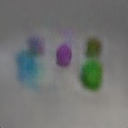

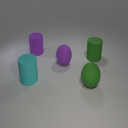

epoch 64 Valid Color: tensor(0.3387, device='cuda:0') shape: tensor(0.1579, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


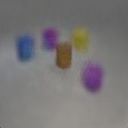

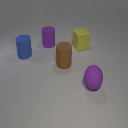

epoch 65 Train Color: tensor(0.0245, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0027, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


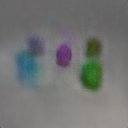

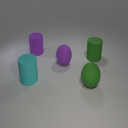

epoch 65 Valid Color: tensor(0.3389, device='cuda:0') shape: tensor(0.1580, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


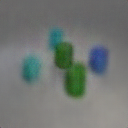

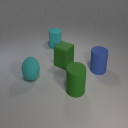

epoch 66 Train Color: tensor(0.0246, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0027, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


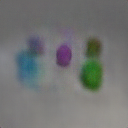

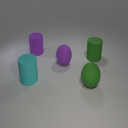

epoch 66 Valid Color: tensor(0.3382, device='cuda:0') shape: tensor(0.1578, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


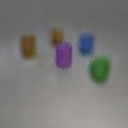

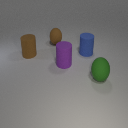

epoch 67 Train Color: tensor(0.0245, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0026, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


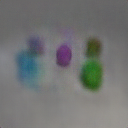

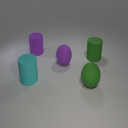

epoch 67 Valid Color: tensor(0.3388, device='cuda:0') shape: tensor(0.1576, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


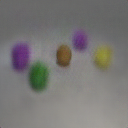

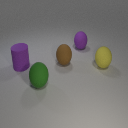

epoch 68 Train Color: tensor(0.0245, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0026, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


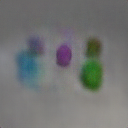

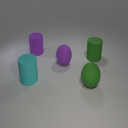

epoch 68 Valid Color: tensor(0.3391, device='cuda:0') shape: tensor(0.1576, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


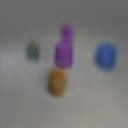

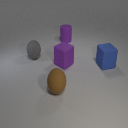

epoch 69 Train Color: tensor(0.0245, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0027, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


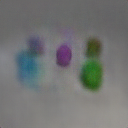

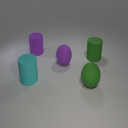

epoch 69 Valid Color: tensor(0.3389, device='cuda:0') shape: tensor(0.1575, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


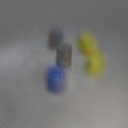

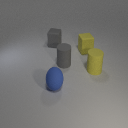

epoch 70 Train Color: tensor(0.0243, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0026, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


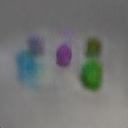

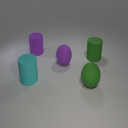

epoch 70 Valid Color: tensor(0.3390, device='cuda:0') shape: tensor(0.1577, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


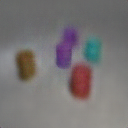

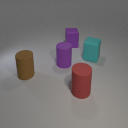

epoch 71 Train Color: tensor(0.0245, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0026, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


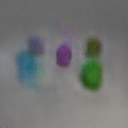

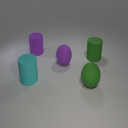

epoch 71 Valid Color: tensor(0.3392, device='cuda:0') shape: tensor(0.1577, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


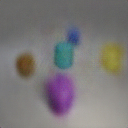

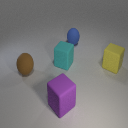

epoch 72 Train Color: tensor(0.0244, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0026, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


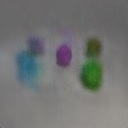

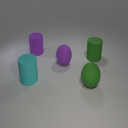

epoch 72 Valid Color: tensor(0.3390, device='cuda:0') shape: tensor(0.1577, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


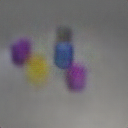

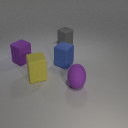

epoch 73 Train Color: tensor(0.0244, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0026, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


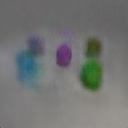

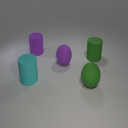

epoch 73 Valid Color: tensor(0.3392, device='cuda:0') shape: tensor(0.1577, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


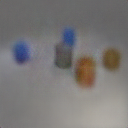

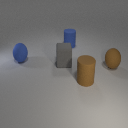

epoch 74 Train Color: tensor(0.0242, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0026, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


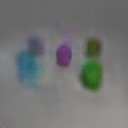

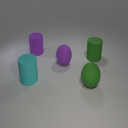

epoch 74 Valid Color: tensor(0.3393, device='cuda:0') shape: tensor(0.1578, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


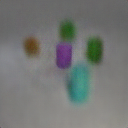

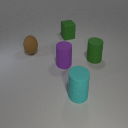

epoch 75 Train Color: tensor(0.0243, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0026, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


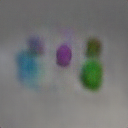

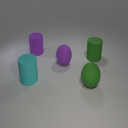

epoch 75 Valid Color: tensor(0.3395, device='cuda:0') shape: tensor(0.1581, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


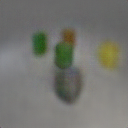

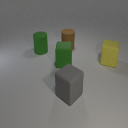

epoch 76 Train Color: tensor(0.0243, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0027, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


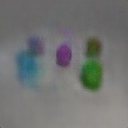

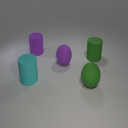

epoch 76 Valid Color: tensor(0.3395, device='cuda:0') shape: tensor(0.1578, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


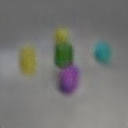

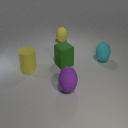

epoch 77 Train Color: tensor(0.0244, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0027, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


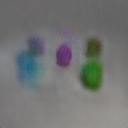

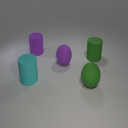

epoch 77 Valid Color: tensor(0.3395, device='cuda:0') shape: tensor(0.1580, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


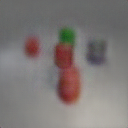

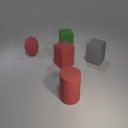

epoch 78 Train Color: tensor(0.0242, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0026, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


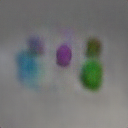

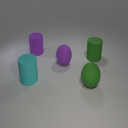

epoch 78 Valid Color: tensor(0.3395, device='cuda:0') shape: tensor(0.1578, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


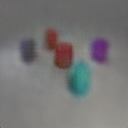

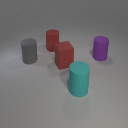

epoch 79 Train Color: tensor(0.0242, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0026, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


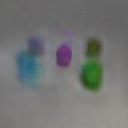

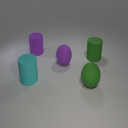

epoch 79 Valid Color: tensor(0.3393, device='cuda:0') shape: tensor(0.1579, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


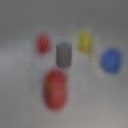

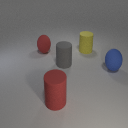

epoch 80 Train Color: tensor(0.0241, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0026, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


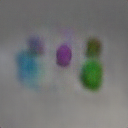

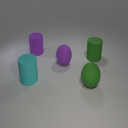

epoch 80 Valid Color: tensor(0.3395, device='cuda:0') shape: tensor(0.1579, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


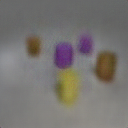

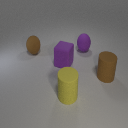

epoch 81 Train Color: tensor(0.0241, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0026, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


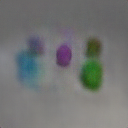

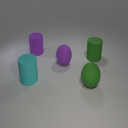

epoch 81 Valid Color: tensor(0.3397, device='cuda:0') shape: tensor(0.1579, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


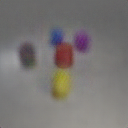

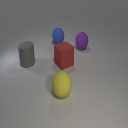

epoch 82 Train Color: tensor(0.0243, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0026, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


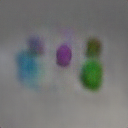

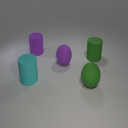

epoch 82 Valid Color: tensor(0.3397, device='cuda:0') shape: tensor(0.1579, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


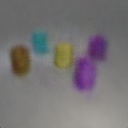

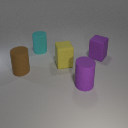

epoch 83 Train Color: tensor(0.0242, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0026, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


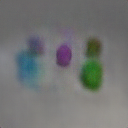

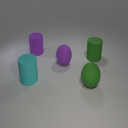

epoch 83 Valid Color: tensor(0.3393, device='cuda:0') shape: tensor(0.1578, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


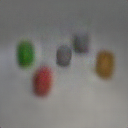

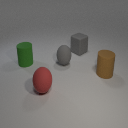

epoch 84 Train Color: tensor(0.0243, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0026, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


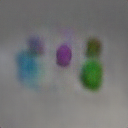

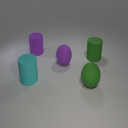

epoch 84 Valid Color: tensor(0.3393, device='cuda:0') shape: tensor(0.1578, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


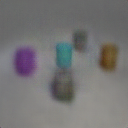

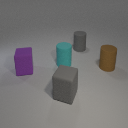

epoch 85 Train Color: tensor(0.0244, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0026, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


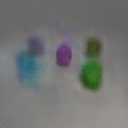

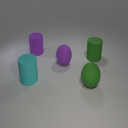

epoch 85 Valid Color: tensor(0.3395, device='cuda:0') shape: tensor(0.1579, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


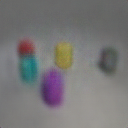

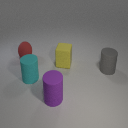

epoch 86 Train Color: tensor(0.0244, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0026, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


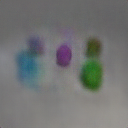

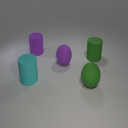

epoch 86 Valid Color: tensor(0.3395, device='cuda:0') shape: tensor(0.1579, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


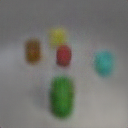

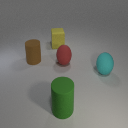

epoch 87 Train Color: tensor(0.0243, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0026, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


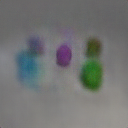

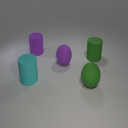

epoch 87 Valid Color: tensor(0.3393, device='cuda:0') shape: tensor(0.1579, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


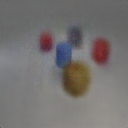

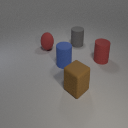

epoch 88 Train Color: tensor(0.0243, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0026, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


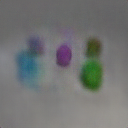

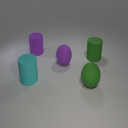

epoch 88 Valid Color: tensor(0.3394, device='cuda:0') shape: tensor(0.1578, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


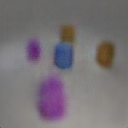

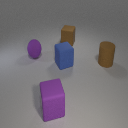

epoch 89 Train Color: tensor(0.0243, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0026, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


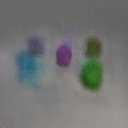

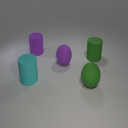

epoch 89 Valid Color: tensor(0.3396, device='cuda:0') shape: tensor(0.1579, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


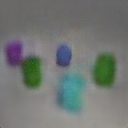

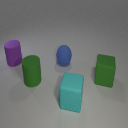

epoch 90 Train Color: tensor(0.0242, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0026, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


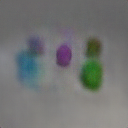

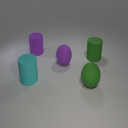

epoch 90 Valid Color: tensor(0.3395, device='cuda:0') shape: tensor(0.1578, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


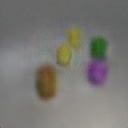

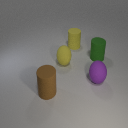

epoch 91 Train Color: tensor(0.0243, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0026, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


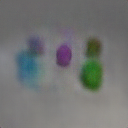

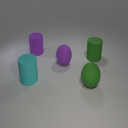

epoch 91 Valid Color: tensor(0.3395, device='cuda:0') shape: tensor(0.1578, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


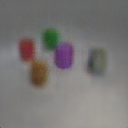

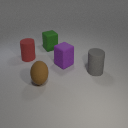

epoch 92 Train Color: tensor(0.0244, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0026, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


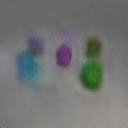

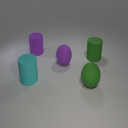

epoch 92 Valid Color: tensor(0.3394, device='cuda:0') shape: tensor(0.1578, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


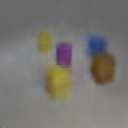

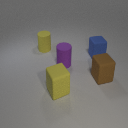

epoch 93 Train Color: tensor(0.0243, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0026, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


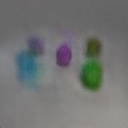

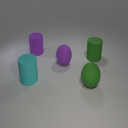

epoch 93 Valid Color: tensor(0.3394, device='cuda:0') shape: tensor(0.1578, device='cuda:0') GMSE: tensor(0.0017, device='cuda:0')


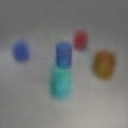

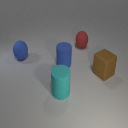

epoch 94 Train Color: tensor(0.0243, device='cuda:0', grad_fn=<DivBackward0>) shape: tensor(0.0026, device='cuda:0', grad_fn=<DivBackward0>) GMSE: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>)


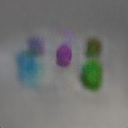

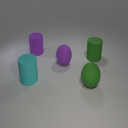

In [ ]:
learning_rate=0.0001
G = Generator()
E = Encoder()
G=torch.load('/content/drive/MyDrive/G_128_20.pt')
E=torch.load('/content/drive/MyDrive/E_128_20.pt')
C=torch.load('/content/drive/MyDrive/C_128.pt')
G.cuda()
E.cuda()
G_optimizer = torch.optim.RMSprop(G.parameters(), lr=learning_rate)
E_optimizer = torch.optim.RMSprop(E.parameters(), lr=learning_rate)
colorweight=0.001
shapeweight=0.002
"""
for epoch in range(20):
  random.shuffle(train_data)
  for i in range(len(train_data)//batch_size):
    start=i*batch_size
    end=(i+1)*batch_size
    trains=train_data[start:end]
    train_imgs=[x[1] for x in trains]
    train_vecs=[x[0] for x in trains]
    x_real=(torch.FloatTensor(train_imgs)/256).transpose(2,3).transpose(1,2).cuda()
    gen_image=G(E(torch.FloatTensor(train_vecs).view(batch_size,-1).cuda()),start).squeeze()
    G_loss2=torch.nn.MSELoss()(gen_image,x_real)
    G.zero_grad()
    E.zero_grad()
    G_loss2.backward()
    G_optimizer.step()
    E_optimizer.step()

torch.save(G,'/content/drive/MyDrive/G_128_20.pt')
"""


for epoch in range(num_epochs):
  random.shuffle(train_data)
  if epoch%10==9:
    G_optimizer.param_groups[0]['lr'] /= 2
    E_optimizer.param_groups[0]['lr'] /= 2
  colorloss=[]
  shapeloss=[]
  GMSELoss=[]
  
    
    
  for i in range(len(train_data)//batch_size):
    start=i*batch_size
    end=(i+1)*batch_size
    trains=train_data[start:end]
    train_imgs=[x[1] for x in trains]
    train_vecs=[x[0] for x in trains]
    c=Variable(torch.ones(batch_size).view(-1,1,1,1)).cuda()
    train_masks=[x[2] for x in trains]
    x_real=(torch.FloatTensor(train_imgs)/256).transpose(2,3).transpose(1,2).cuda()
    #masks=(torch.FloatTensor(train_masks)).cuda()
    gen_vecs=E(torch.FloatTensor(train_vecs).view(batch_size,-1).cuda())
    gen_image=G(gen_vecs,c).squeeze()

    totalloss=0
    attrvec=torch.LongTensor(train_vecs).view(batch_size,-1)

    for j in range(5):
      parts=buildsubp([x[j][0] for x in train_masks],[x[j][1] for x in train_masks],gen_image).cuda()
      newvecs=attrvec[:,j*75:j*75+64].cuda()
      shapevecs=attrvec[:,j*75+64:j*75+67]
      colorvecs=attrvec[:,j*75+67:j*75+75]
      shapelabels=torch.matmul(shapevecs,mat3)
      colorlabels=torch.matmul(colorvecs,mat8)
      #print(shapelabels)
      Cout=C(parts,newvecs.float())
      loss1=ce(Cout[:,0:3],shapelabels.squeeze().cuda())
      loss2=ce(Cout[:,3:11],colorlabels.squeeze().cuda())
      
      colorloss.append(loss2)
      shapeloss.append(loss1)
      totalloss+=colorweight*loss2+shapeweight*loss1

    G_loss1=(torch.nn.MSELoss()(gen_image,x_real))
    GMSELoss.append(G_loss1)
    G_loss=G_loss1+totalloss
    G.zero_grad()
    E.zero_grad()
    G_loss.backward()
    E_optimizer.step()
    G_optimizer.step()

    if i==0:
        img=gen_image[0].tolist()
        cv2_imshow(toimg(img))
        #img=(gen_image[0]*mask[0]).tolist()
        #cv2_imshow(toimg(img))
        img=x_real[0].tolist()
        cv2_imshow(toimg(img))
        #img=(x_real[0]*mask[0]).tolist()
        #cv2_imshow(toimg(img))

  #print(DLoss)
  #print("Epoch "+str(epoch)+" GMSE: "+str(takeavg(GMSELoss))+" GGAN: "+str(takeavg(GGANLoss))+"\n")
  print('epoch '+str(epoch)+' Train Color: '+str(takeavg(colorloss))+' shape: '+str(takeavg(shapeloss))+" GMSE: "+str(takeavg(GMSELoss)))
  colorloss=[]
  shapeloss=[]
  GMSELoss=[]
  with torch.no_grad():
    for i in range(len(valid_data)//batch_size):
      start=i*batch_size
      end=(i+1)*batch_size
      trains=valid_data[start:end]
      train_imgs=[x[1] for x in trains]
      train_vecs=[x[0] for x in trains]
      c=Variable(torch.ones(batch_size).view(-1,1,1,1)).cuda()
      train_masks=[x[2] for x in trains]
      x_real=(torch.FloatTensor(train_imgs)/256).transpose(2,3).transpose(1,2).cuda()
      gen_vecs=E(torch.FloatTensor(train_vecs).view(batch_size,-1).cuda())
      gen_image=G(gen_vecs,c).squeeze()
      attrvec=torch.LongTensor(train_vecs).view(batch_size,-1)

      totalloss=0

      for j in range(5):
        parts=buildsubp([x[j][0] for x in train_masks],[x[j][1] for x in train_masks],gen_image).cuda()
        newvecs=attrvec[:,j*75:j*75+64].cuda()
        shapevecs=attrvec[:,j*75+64:j*75+67]
        colorvecs=attrvec[:,j*75+67:j*75+75]
        shapelabels=torch.matmul(shapevecs,mat3)
        colorlabels=torch.matmul(colorvecs,mat8)
        #print(shapelabels)
        Cout=C(parts,newvecs.float())
        loss1=ce(Cout[:,0:3],shapelabels.squeeze().cuda())
        loss2=ce(Cout[:,3:11],colorlabels.squeeze().cuda())
      
        colorloss.append(loss2)
        shapeloss.append(loss1)
        #totalloss+=colorweight*loss2+shapeweight*loss1

      G_loss1=(torch.nn.MSELoss()(gen_image,x_real))
      GMSELoss.append(G_loss1)

      if i==0:
        img=gen_image[0].tolist()
        cv2_imshow(toimg(img))
        #img=(gen_image[0]*mask[0]).tolist()
        #cv2_imshow(toimg(img))
        img=x_real[0].tolist()
        cv2_imshow(toimg(img))
        #img=(x_real[0]*mask[0]).tolist()
        #cv2_imshow(toimg(img))
  print('epoch '+str(epoch)+' Valid Color: '+str(takeavg(colorloss))+' shape: '+str(takeavg(shapeloss))+" GMSE: "+str(takeavg(GMSELoss)))
  if epoch % 25 == 24:
    torch.save(G,'/content/drive/MyDrive/G_128_'+str(epoch)+'.pt')

In [ ]:
torch.save(G,'/content/drive/MyDrive/G_classifier.pt')
torch.save(E,'/content/drive/MyDrive/E_classifier.pt')

In [ ]:
!nvidia-smi

Fri Dec  4 21:04:38 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 455.45.01    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   65C    P0    30W /  70W |   2039MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------